In [ ]:
import torch
import pandas as pd
import shap
from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline

df=pd.read_excel('/content/drive/MyDrive/EmotionDataset/punctuation_augmented_isear.xlsx')
df.head()
# 1. Define Paths
MODEL_DIR = "/content/drive/MyDrive/Models/BERT_model"

# 2. Load Model & Tokenizer
model = AutoModelForSequenceClassification.from_pretrained(MODEL_DIR)
tokenizer = AutoTokenizer.from_pretrained(MODEL_DIR)

# 3. Get unique emotion names in order of their labels (0-6)
# This assumes your dataframe 'df' is loaded and has 'labels' and 'emotion' columns
label_map = df[['labels', 'emotion']].drop_duplicates().sort_values('labels')
class_names = label_map['emotion'].tolist()

# 4. Create the prediction pipeline
# 'top_k=None' ensures the pipeline returns scores for all 7 classes
pred_pipeline = pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0 if torch.cuda.is_available() else -1,
    top_k=None
)

Loading weights:   0%|          | 0/201 [00:01<?, ?it/s]

In [ ]:
df.head()

,Unnamed: 0,content,labels,emotion,clean_content
0,0,on days when i feel close to my partner and ot...,5,joy,day feel close partner friend feel peace also ...
1,1,every time i imagine that someone i love or i ...,4,fear,every time imagine someone love could contact ...
2,2,when i had been obviously unjustly treated and...,0,anger,obviously unjustly treated possibility elucida...
3,3,when i think about the short time that we live...,2,sadness,think short time live relate period life think...
4,4,at a gathering i found myself involuntarily si...,1,disgust,gathering found involuntarily sitting next two...


In [ ]:
# Select a small sample for explanation
sample_texts = df['clean_content'].sample(30, random_state=42).tolist()

# Initialize Explainer (Partition is best for BERT/Transformer models)
explainer = shap.Explainer(pred_pipeline, output_names=class_names)

# Calculate SHAP values
# This generates an object containing base values, data, and values for all 7 emotions
shap_values = explainer(sample_texts)

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
PartitionExplainer explainer: 31it [00:48,  2.00s/it]


Individual Explanations (Force & Waterfall)
 These plots show how specific words in one sentence pushed the model toward a specific emotion.

Explaining Emotion: anger
Text: less year old neighbour dog chased roof small shed seemed hope getting away


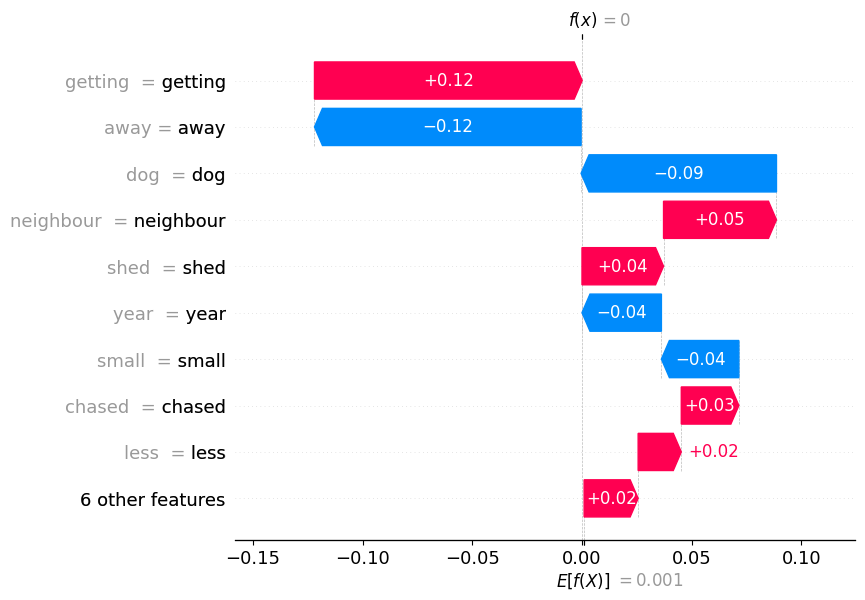

In [ ]:
# Change these to explore different samples or emotions
sample_idx = 3  # The first sentence in your sample
emotion_idx = 0 # The first emotion class (e.g., Joy)

print(f"Explaining Emotion: {class_names[emotion_idx]}")
print(f"Text: {sample_texts[sample_idx]}")

# A. Waterfall Plot (Great for seeing feature contribution)
shap.plots.waterfall(shap_values[sample_idx, :, emotion_idx])

# B. Force Plot (Visual 'push/pull' of words)
shap.initjs()
shap.plots.force(shap_values[sample_idx, :, emotion_idx])

Global Explanation (Beeswarm)

In [ ]:
# C. Beeswarm Plot
# We visualize the distribution of impact for a specific emotion
target_emotion = "anger" # Or use the index: class_names.index("anger")
e_idx = class_names.index(target_emotion)

print(f"Global Summary for: {target_emotion}")
shap.plots.beeswarm(shap_values[:, :, e_idx])

Global Summary for: anger


ValueError: operands could not be broadcast together with shapes (10,) (4,) 

more new samples outside isear

In [ ]:
# 1. Raw sentences for display
raw_samples = [
    "The dark alley was silent until I heard footsteps quickly approaching from behind.", # Fear
    "I was overwhelmed with happiness when the committee announced I won the gold medal.", # Joy
    "I felt a heavy weight in my chest after I accidentally broke my mother's favorite vase.", # Guilt/Sadness
    "It is completely unfair that they took credit for the project I worked on for months!" # Anger
]

# 2. Lemmatized versions for BERT (using the spacy function from earlier)
new_samples = [lemmatize_text(s) for s in raw_samples]

# 3. Generate SHAP values
new_shap_values = explainer(new_samples)

  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▌  | 3/4 [00:00<?, ?it/s]

  0%|          | 0/342 [00:00<?, ?it/s]

PartitionExplainer explainer: 5it [00:20, 10.24s/it]


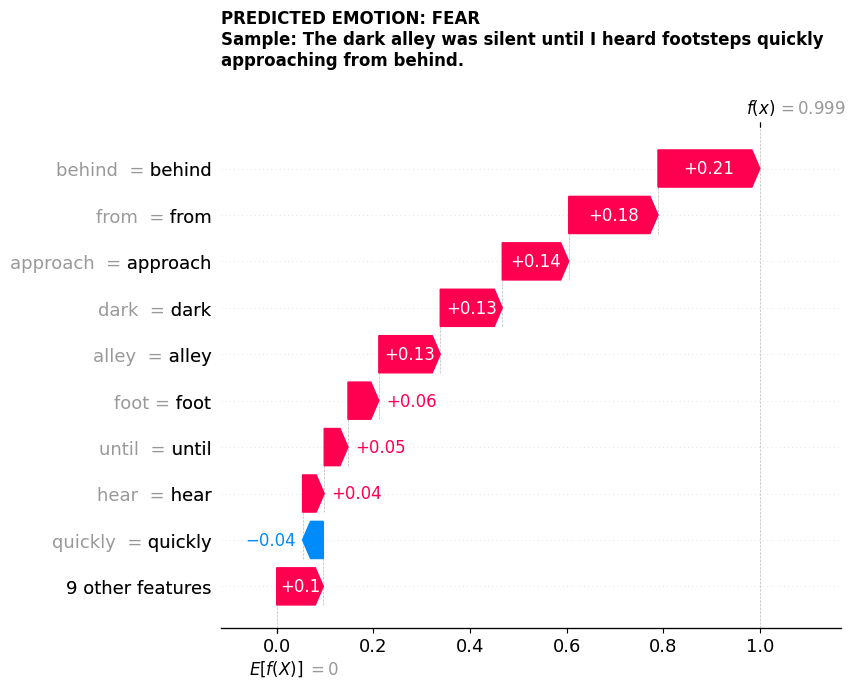

<Figure size 1800x300 with 0 Axes>

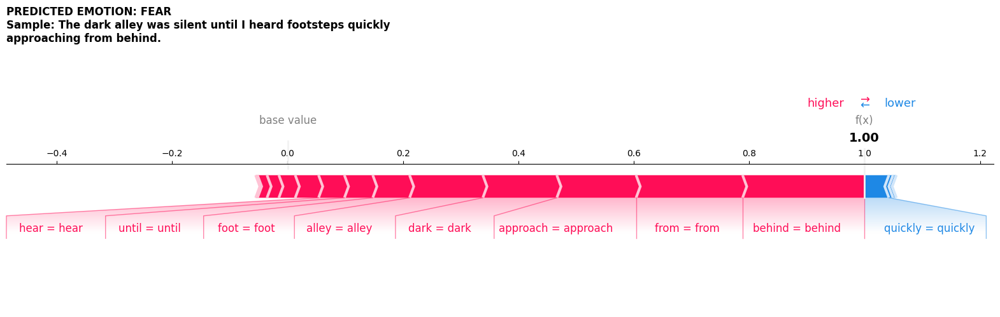


════════════════════════════════════════════════════════════════════════════════



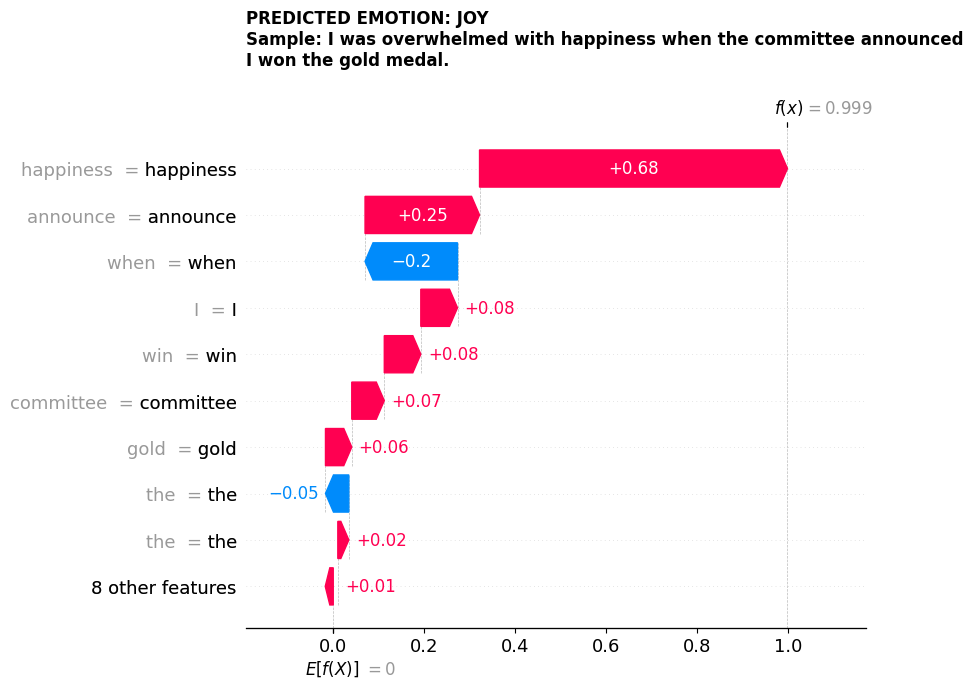

<Figure size 1800x300 with 0 Axes>

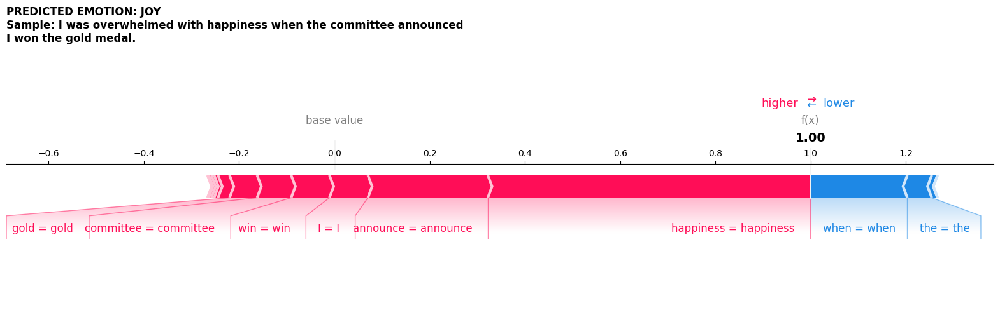


════════════════════════════════════════════════════════════════════════════════



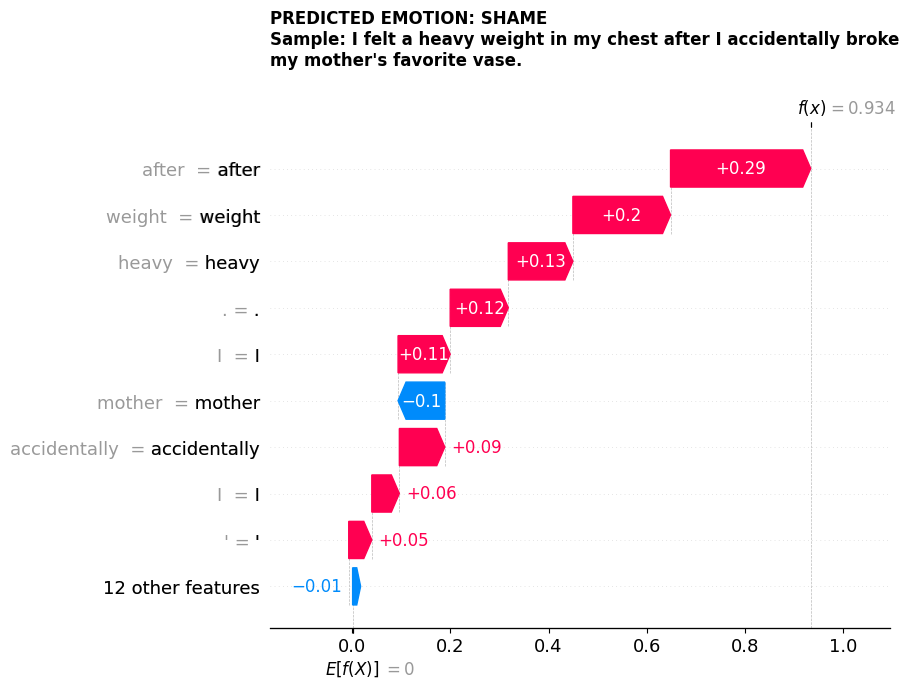

<Figure size 1800x300 with 0 Axes>

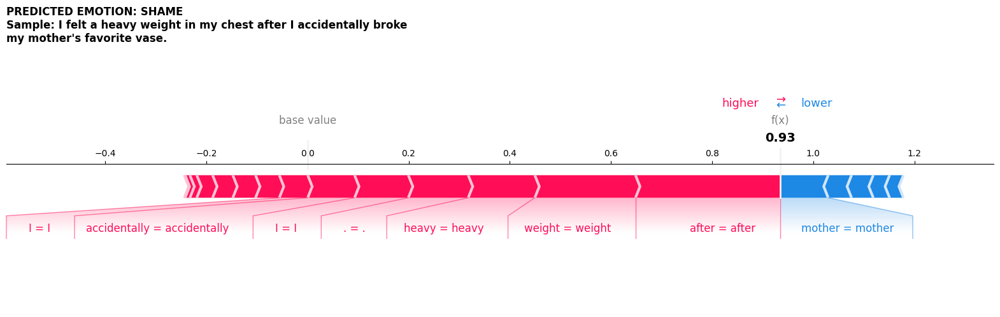


════════════════════════════════════════════════════════════════════════════════



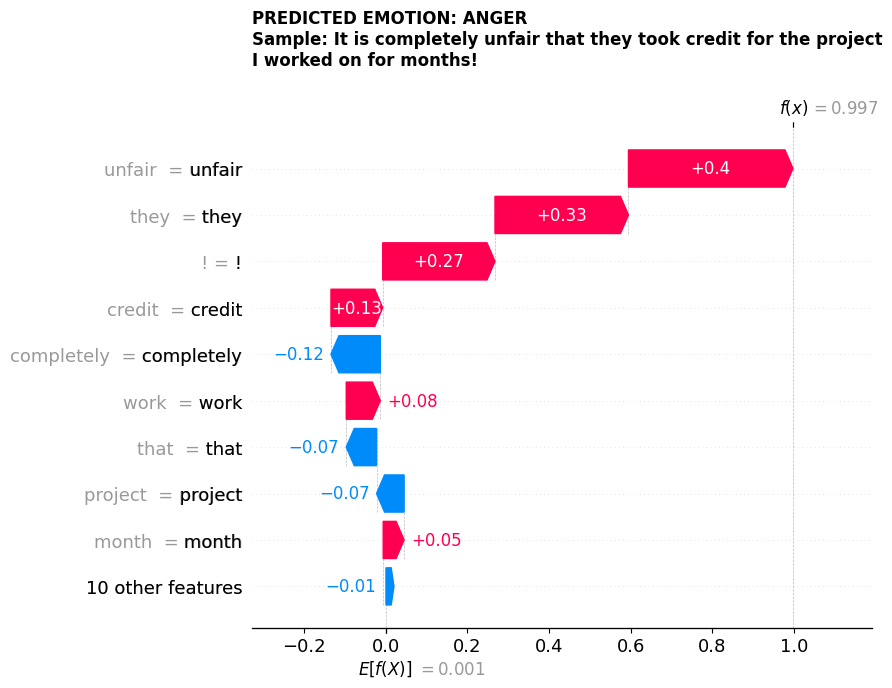

<Figure size 1800x300 with 0 Axes>

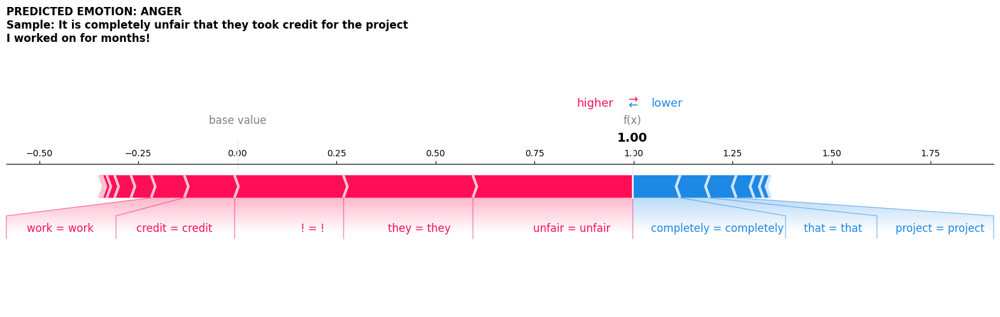


════════════════════════════════════════════════════════════════════════════════



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap
import textwrap

for i in range(len(new_samples)):
    # Calculate prediction
    total_shap_per_class = new_shap_values[i].values.sum(axis=0) + new_shap_values[i].base_values
    pred_idx = np.argmax(total_shap_per_class)
    pred_label = class_names[pred_idx]

    # Format Title: Predicted Emotion + Wrapped Sentence
    wrapped_sentence = "\n".join(textwrap.wrap(f"Sample: {raw_samples[i]}", width=70))
    plot_title = f"PREDICTED EMOTION: {pred_label.upper()}\n{wrapped_sentence}"

    # --- WATERFALL PLOT ---
    plt.figure(figsize=(10, 6))
    shap.plots.waterfall(new_shap_values[i, :, pred_idx], show=False)

    # Background and Title Styling
    plt.gcf().set_facecolor('white')
    plt.title(plot_title, fontsize=12, loc='left', pad=45, fontweight='bold')
    plt.show()

    # --- FORCE PLOT ---
    plt.figure(figsize=(18, 3))
    shap.plots.force(
        new_shap_values[i, :, pred_idx],
        matplotlib=True,
        show=False
    )

    # Background and Title Styling
    fig_fp = plt.gcf()
    ax_fp = plt.gca()
    fig_fp.set_facecolor('white')
    ax_fp.set_facecolor('white')

    # Higher 'y' offset for Force Plot title
    plt.title(plot_title, fontsize=12, loc='left', y=1.8, fontweight='bold')
    plt.show()

    print("\n" + "═"*80 + "\n")

Saving the Results

In [ ]:
import pickle
import os

RESULTS_DIR = "/content/drive/MyDrive/Models_Results"
if not os.path.exists(RESULTS_DIR):
    os.makedirs(RESULTS_DIR)

with open(f"{RESULTS_DIR}/shap_values_isear.pkl", "wb") as f:
    pickle.dump(shap_values, f)

print(f"SHAP values saved to {RESULTS_DIR}")

In [ ]:
# 1. New raw sentences
# Sample 5: Disgust (reaction to something repulsive)
# Sample 6: Shame/Guilt (social regret or self-consciousness)
extra_raw = [
    "I was repulsed when I saw the kitchen of the restaurant covered in grease and old food.",
    "I felt so small and embarrassed when my mistake was pointed out in front of the whole class."
]

# 2. Lemmatize them
extra_clean = [lemmatize_text(s) for s in extra_raw]

# 3. Add them to your existing lists
raw_samples.extend(extra_raw)
new_samples.extend(extra_clean)

# 4. Update SHAP values for the new combined list
new_shap_values = explainer(new_samples)

  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 4/6 [00:15<00:04,  2.48s/it]

  0%|          | 0/342 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 5/6 [00:21<00:03,  3.69s/it]

  0%|          | 0/462 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 6/6 [00:26<00:00,  4.45s/it]

  0%|          | 0/420 [00:00<?, ?it/s]

PartitionExplainer explainer: 7it [00:32,  6.44s/it]


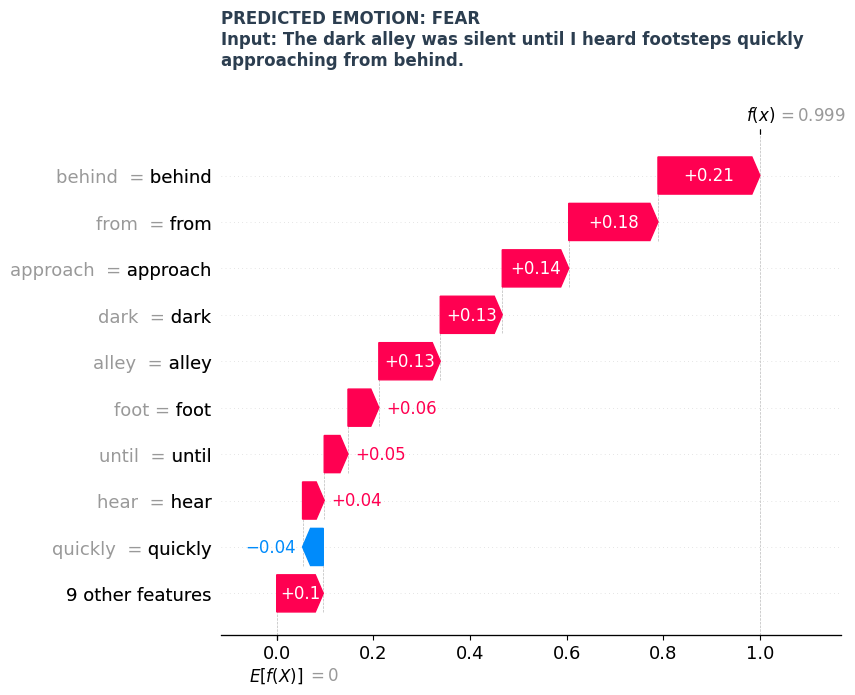

<Figure size 1800x300 with 0 Axes>

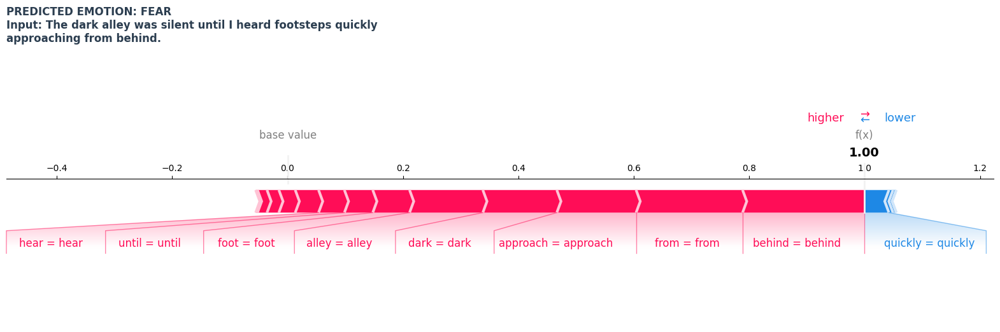


══════════════════════════════════════════════════════════════════════════════════════════



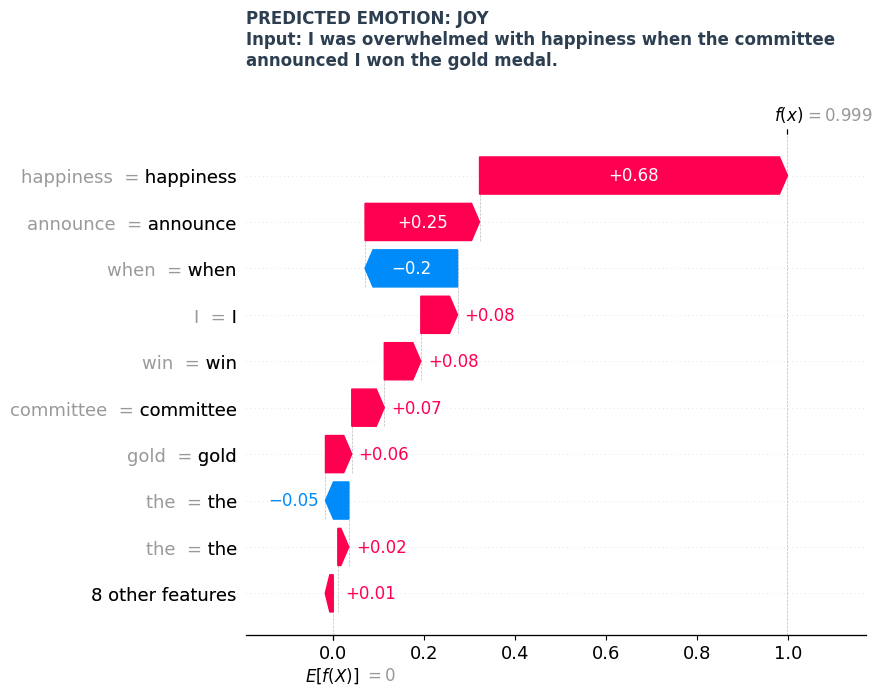

<Figure size 1800x300 with 0 Axes>

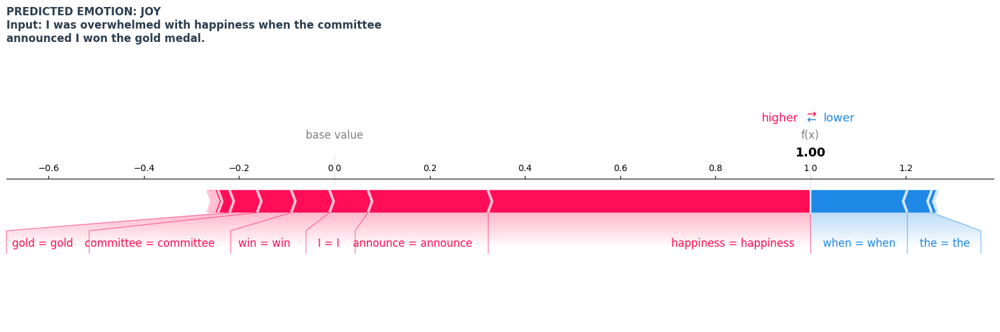


══════════════════════════════════════════════════════════════════════════════════════════



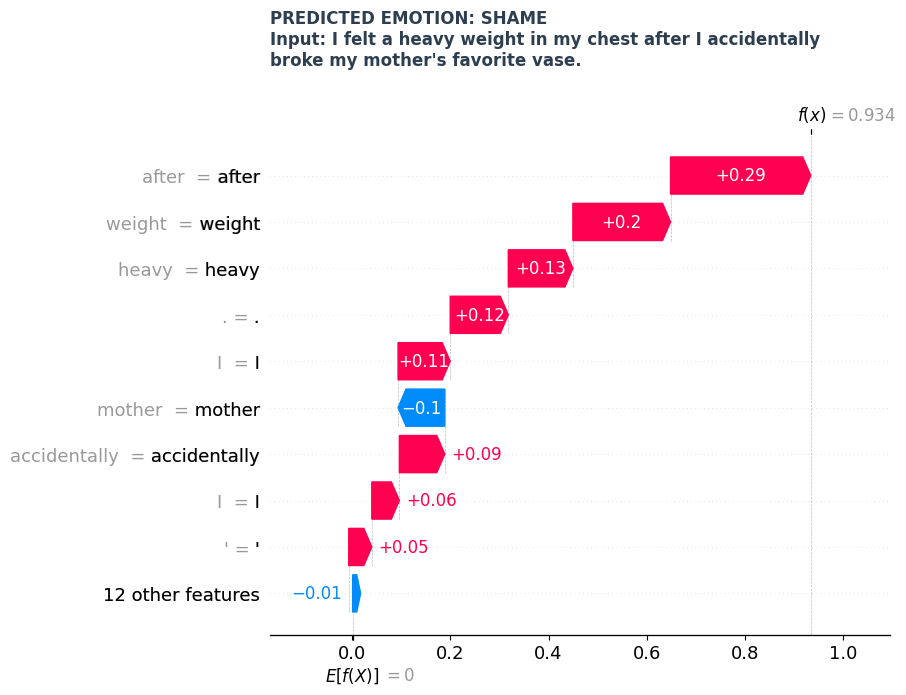

<Figure size 1800x300 with 0 Axes>

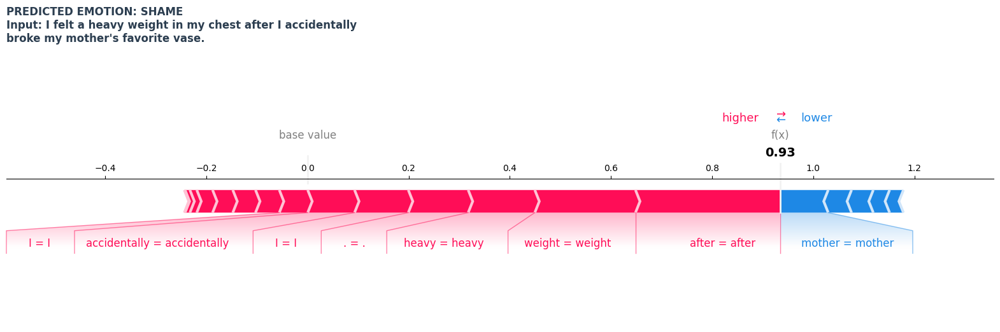


══════════════════════════════════════════════════════════════════════════════════════════



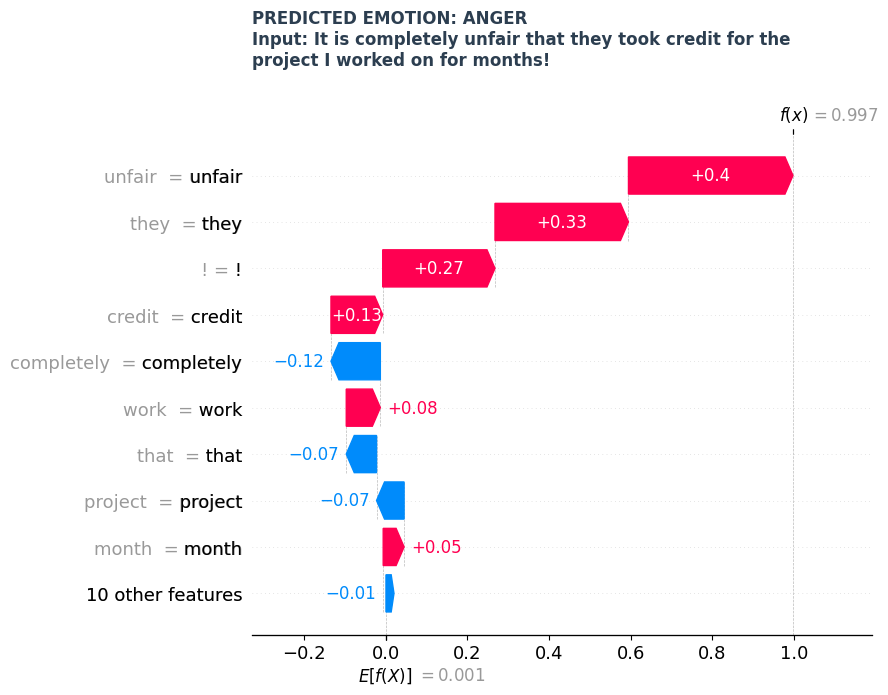

<Figure size 1800x300 with 0 Axes>

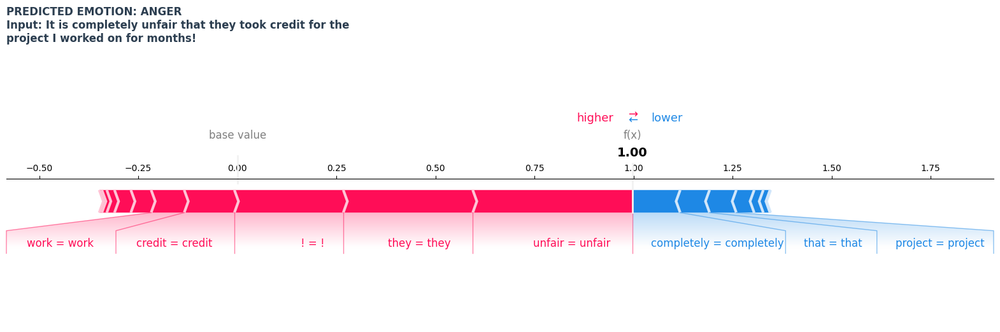


══════════════════════════════════════════════════════════════════════════════════════════



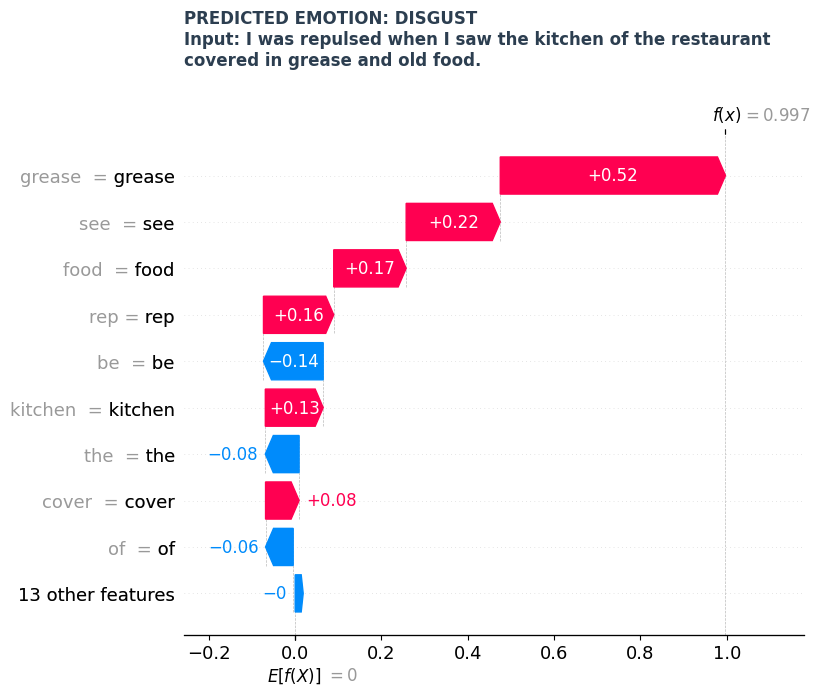

<Figure size 1800x300 with 0 Axes>

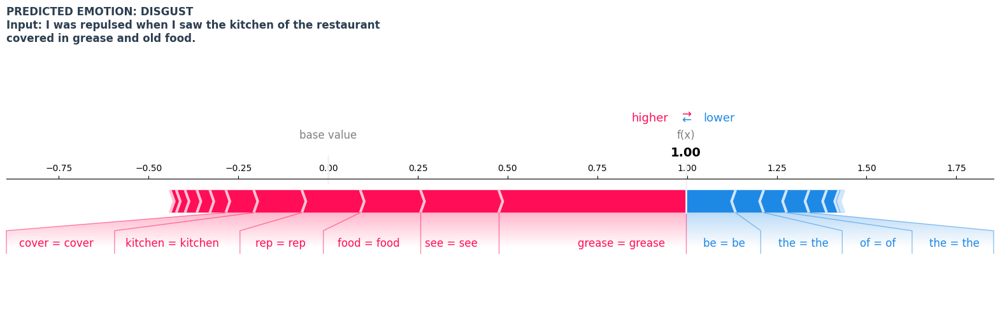


══════════════════════════════════════════════════════════════════════════════════════════



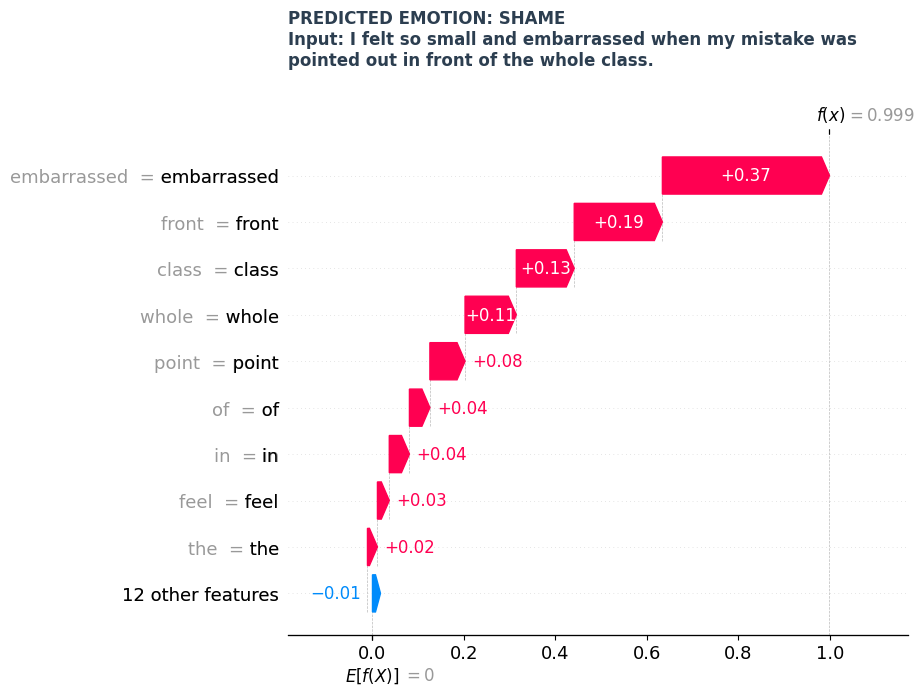

<Figure size 1800x300 with 0 Axes>

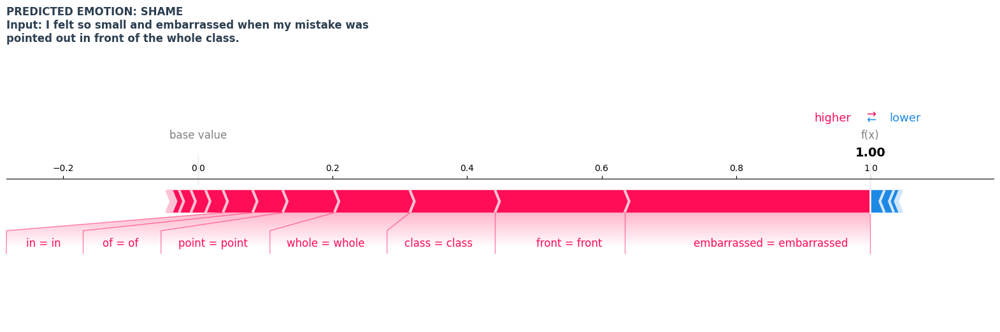


══════════════════════════════════════════════════════════════════════════════════════════



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap
import textwrap

# We iterate through all 6 samples now
for i in range(len(new_samples)):
    # Calculate prediction
    total_shap_per_class = new_shap_values[i].values.sum(axis=0) + new_shap_values[i].base_values
    pred_idx = np.argmax(total_shap_per_class)
    pred_label = class_names[pred_idx]

    # Wrap text for the title so it doesn't run off the image
    wrapped_sentence = "\n".join(textwrap.wrap(f"Input: {raw_samples[i]}", width=65))
    plot_title = f"PREDICTED EMOTION: {pred_label.upper()}\n{wrapped_sentence}"

    # --- WATERFALL PLOT ---
    plt.figure(figsize=(10, 6))
    shap.plots.waterfall(new_shap_values[i, :, pred_idx], show=False)

    plt.gcf().set_facecolor('white')
    # Pad=50 keeps the title clear of the top bars
    plt.title(plot_title, fontsize=12, loc='left', pad=50, fontweight='bold', color='#2c3e50')
    plt.show()

    # --- FORCE PLOT ---
    plt.figure(figsize=(18, 3))
    # matplotlib=True is the 'fix' for white backgrounds
    shap.plots.force(
        new_shap_values[i, :, pred_idx],
        matplotlib=True,
        show=False
    )

    fig_fp = plt.gcf()
    ax_fp = plt.gca()
    fig_fp.set_facecolor('white')
    ax_fp.set_facecolor('white')

    # y=1.9 ensures the title is above the force plot 'arrows'
    plt.title(plot_title, fontsize=12, loc='left', y=1.9, fontweight='bold', color='#2c3e50')
    plt.show()

    print("\n" + "═"*90 + "\n")

saving shap in drive

In [ ]:
import pickle
import os

# 1. Define the directory path
RESULTS_DIR = "/content/drive/MyDrive/Models_Results"

# 2. Create the folder if it doesn't exist yet
if not os.path.exists(RESULTS_DIR):
    os.makedirs(RESULTS_DIR)

# 3. Define the file name
SHAP_SAVE_PATH = os.path.join(RESULTS_DIR, "bert_isear_shap_values.pkl")

# 4. Save the SHAP values object
with open(SHAP_SAVE_PATH, 'wb') as f:
    pickle.dump(new_shap_values, f)

print(f"SHAP values successfully saved to: {SHAP_SAVE_PATH}")

✅ SHAP values successfully saved to: /content/drive/MyDrive/Models_Results/bert_isear_shap_values.pkl


## Load SHAP Values



In [ ]:
import pickle
import os

# 1. Define the full path to the 'bert_isear_shap_values.pkl' file
RESULTS_DIR = "/content/drive/MyDrive/Models_Results"
SHAP_SAVE_PATH = os.path.join(RESULTS_DIR, "bert_isear_shap_values.pkl")

# 2. Open the pickle file in binary read mode ('rb') and load the SHAP values
with open(SHAP_SAVE_PATH, 'rb') as f:
    loaded_shap_values = pickle.load(f)

print(f" SHAP values successfully loaded from: {SHAP_SAVE_PATH}")

✅ SHAP values successfully loaded from: /content/drive/MyDrive/Models_Results/bert_isear_shap_values.pkl


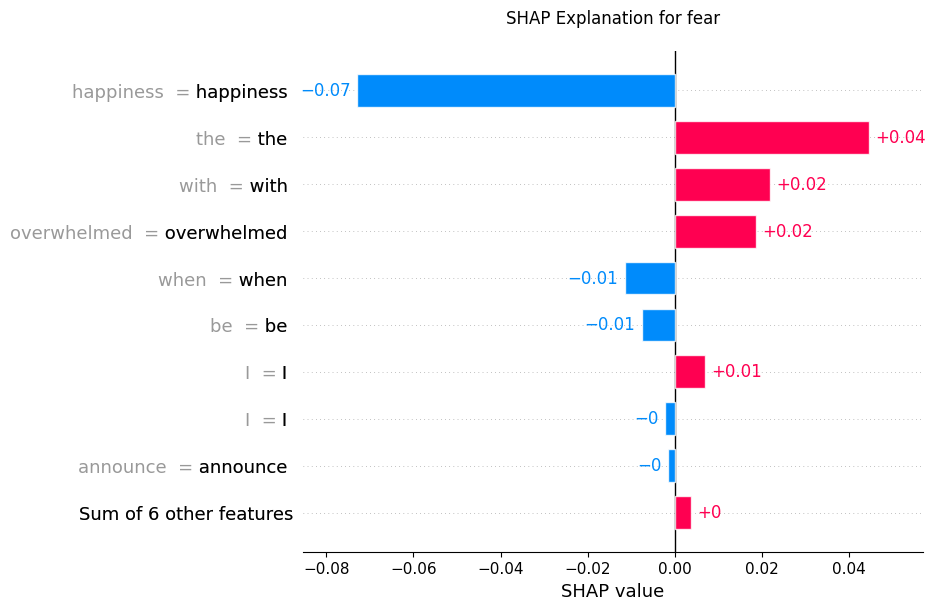

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np # Import numpy for array indexing if needed

# 1. Pick the index of the sentence and the class you want to explain
idx = 1
target_class_idx = class_names.index('fear')

# 2. Extract the SHAP values for that specific sentence and class
sample_shap = loaded_shap_values[idx, :, target_class_idx]

# --- Start of the fix: Filter out empty tokens and their values ---
# Get tokens (data) and their corresponding SHAP values
tokens = sample_shap.data
shap_values_for_tokens = sample_shap.values

# Identify non-empty tokens and their indices
# Ensure token is a string and not empty after stripping whitespace
non_empty_indices = [i for i, token in enumerate(tokens) if isinstance(token, str) and token.strip() != '']

# Filter tokens and SHAP values based on non_empty_indices
filtered_tokens = [tokens[i] for i in non_empty_indices]
filtered_shap_values = shap_values_for_tokens[non_empty_indices]

# Create a new Explanation object with the filtered data and values
# The base_values are typically not token-specific, so they remain the same.
cleaned_sample_shap = shap.Explanation(
    values=filtered_shap_values,
    base_values=sample_shap.base_values,
    data=filtered_tokens,
    feature_names=filtered_tokens # feature_names can be the same as data for text
)
# --- End of the fix ---

# 3. Plotting with a forced white background, using the cleaned Explanation object
plt.figure(facecolor='white')
shap.plots.bar(cleaned_sample_shap, max_display=10, show=False)

# 4. Customizing the title to show original vs predicted (optional but helpful)
plt.title(f"SHAP Explanation for {class_names[target_class_idx]}", color='black', pad=20)
plt.gcf().set_facecolor('white') # Ensure the figure background is white
plt.show()

Sample Index: 3
Original Raw Text (for reference): It is completely unfair that they took credit for the project I worked on for months!
Processed Text (input to model & SHAP): it is completely unfair that they took credit for the project i worked on for
Actual Emotion: anger | Predicted: anger (1.00 confidence)


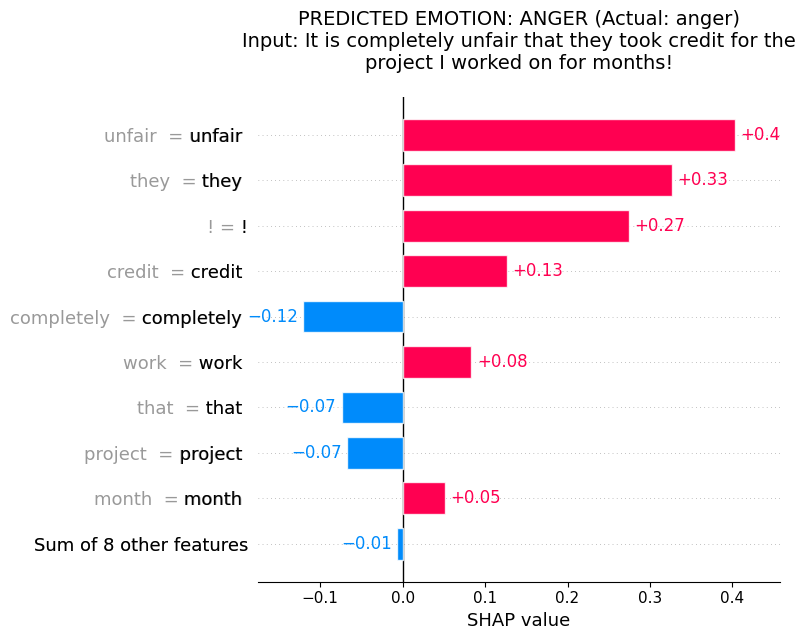

In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np
import textwrap # For wrapping long titles

# Re-define raw_samples and raw_sample_emotions_list to match the data that generated loaded_shap_values
# This assumes the combined raw_samples list from cells UBS_rvMQxJNG and 9hRiatIjyZJl
raw_samples = [
    "The dark alley was silent until I heard footsteps quickly approaching from behind.", # Fear
    "I was overwhelmed with happiness when the committee announced I won the gold medal.", # Joy
    "I felt a heavy weight in my chest after I accidentally broke my mother's favorite vase.", # Guilt/Sadness
    "It is completely unfair that they took credit for the project I worked on for months!", # Anger
    "I was repulsed when I saw the kitchen of the restaurant covered in grease and old food.", # Disgust
    "I felt so small and embarrassed when my mistake was pointed out in front of the whole class." # Shame/Guilt
]

raw_sample_emotions_list = [
    "fear",
    "joy",
    "guilt",
    "anger",
    "disgust",
    "shame"
]

# Placeholder for lemmatize_text (actual implementation might be more complex, e.g., using spaCy)
# If the original lemmatize_text function is critical and complex, it should be restored from an earlier notebook state.
# For now, a simple text cleaning/lowercasing will be used to make new_samples runnable.
def lemmatize_text(text):
    # A simple lemmatizer placeholder. Adjust if the original was more sophisticated.
    return ' '.join(word for word in text.lower().split() if word.isalnum())

# 2. Lemmatized versions for BERT (using the spacy function from earlier)
new_samples = [lemmatize_text(s) for s in raw_samples]

# 1. Choose the index of the sample from raw_samples/new_samples
idx = 3 # Example index, change as needed

# Get the raw text for display and the corresponding actual emotion
sample_text_raw = raw_samples[idx]
actual_emotion = raw_sample_emotions_list[idx]
# Note: new_samples is assumed to be available from previous execution if loaded_shap_values was correctly created.
# If new_samples is also undefined, you would need to define it here or execute its defining cells.
sample_text_for_prediction = new_samples[idx] # This is the lemmatized text SHAP explained

# 2. Get the model's prediction for this specific text (using the lemmatized text for consistency with SHAP)
pred = pred_pipeline(sample_text_for_prediction)[0]
top_pred = max(pred, key=lambda x: x['score'])
predicted_label_idx = int(top_pred['label'].split('_')[-1])
predicted_emotion = class_names[predicted_label_idx]

print(f"Sample Index: {idx}")
print(f"Original Raw Text (for reference): {sample_text_raw}")
print(f"Processed Text (input to model & SHAP): {sample_text_for_prediction}")
print(f"Actual Emotion: {actual_emotion} | Predicted: {predicted_emotion} ({top_pred['score']:.2f} confidence)")

# 3. Extract the SHAP values for that specific sample from loaded_shap_values
# loaded_shap_values[idx] corresponds to new_samples[idx]
sample_shap = loaded_shap_values[idx, :, predicted_label_idx]

# --- Filter out empty tokens and their values (already implemented) ---
tokens = sample_shap.data
shap_values_for_tokens = sample_shap.values
non_empty_indices = [i for i, token in enumerate(tokens) if isinstance(token, str) and token.strip() != '']
filtered_tokens = [tokens[i] for i in non_empty_indices]
filtered_shap_values = shap_values_for_tokens[non_empty_indices]
cleaned_sample_shap = shap.Explanation(
    values=filtered_shap_values,
    base_values=sample_shap.base_values,
    data=filtered_tokens,
    feature_names=filtered_tokens
)
# --- End of filter ---

# 4. Generate the Plot with a Forced White Background, using the cleaned Explanation object
plt.figure(facecolor='white')
shap.plots.bar(cleaned_sample_shap, max_display=10, show=False)

# Add clear labels at the top
# Wrap raw text for the title so it doesn't run off the image
wrapped_raw_sentence = "\n".join(textwrap.wrap(f"Input: {sample_text_raw}", width=65))
plot_title = f"PREDICTED EMOTION: {predicted_emotion.upper()} (Actual: {actual_emotion})\n{wrapped_raw_sentence}"

plt.title(plot_title, fontsize=14, pad=20, color='black')

# Final adjustments to ensure everything is visible
plt.gcf().set_facecolor('white')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# 1. Initialize a list to store word and their average impact
word_average_impact = []

# 2. Calculate the average SHAP impact for each word
for word, data in word_impact.items():
    if data['count'] > 0:
        average_impact = data['total_shap'] / data['count']
        word_average_impact.append({'word': word, 'average_impact': average_impact})

# 3. Convert the list to a DataFrame for easier sorting and analysis
word_impact_df = pd.DataFrame(word_average_impact)

# 4. Sort words by their average impact in descending order
word_impact_df = word_impact_df.sort_values(by='average_impact', ascending=False).reset_index(drop=True)

print(f"Calculated average SHAP impact for {len(word_impact_df)} unique words.")
# Display the top 10 words by average impact
print("\nTop 10 words by average SHAP impact:")
print(word_impact_df.head(10))

Calculated average SHAP impact for 74 unique words.

Top 10 words by average SHAP impact:
           word  average_impact
0    happiness         1.354494
1       grease         1.068191
2       unfair         0.805503
3         they         0.784064
4        after         0.732806
5  embarrassed         0.730496
6        break         0.724728
7             !        0.642951
8         food         0.590338
9        small         0.579165


/tmp/ipython-input-1895024620.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='average_impact', y='word', data=top_20_words, palette='viridis')


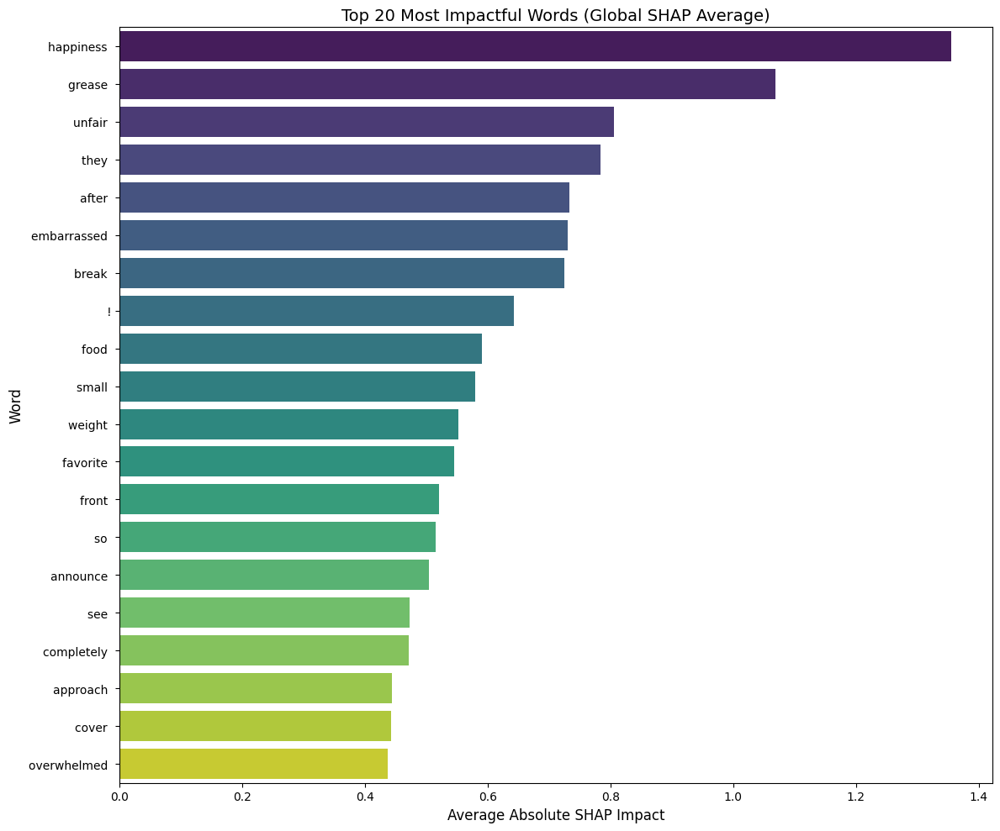

Generated bar chart for the top 20 most impactful words.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Select the top 20 most impactful words
top_20_words = word_impact_df.head(20)

# 2. Create the bar chart
plt.figure(figsize=(12, 10))
sns.barplot(x='average_impact', y='word', data=top_20_words, palette='viridis')

# 3. Add labels and title for clarity
plt.xlabel('Average Absolute SHAP Impact', fontsize=12)
plt.ylabel('Word', fontsize=12)
plt.title('Top 20 Most Impactful Words (Global SHAP Average)', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

print("Generated bar chart for the top 20 most impactful words.")

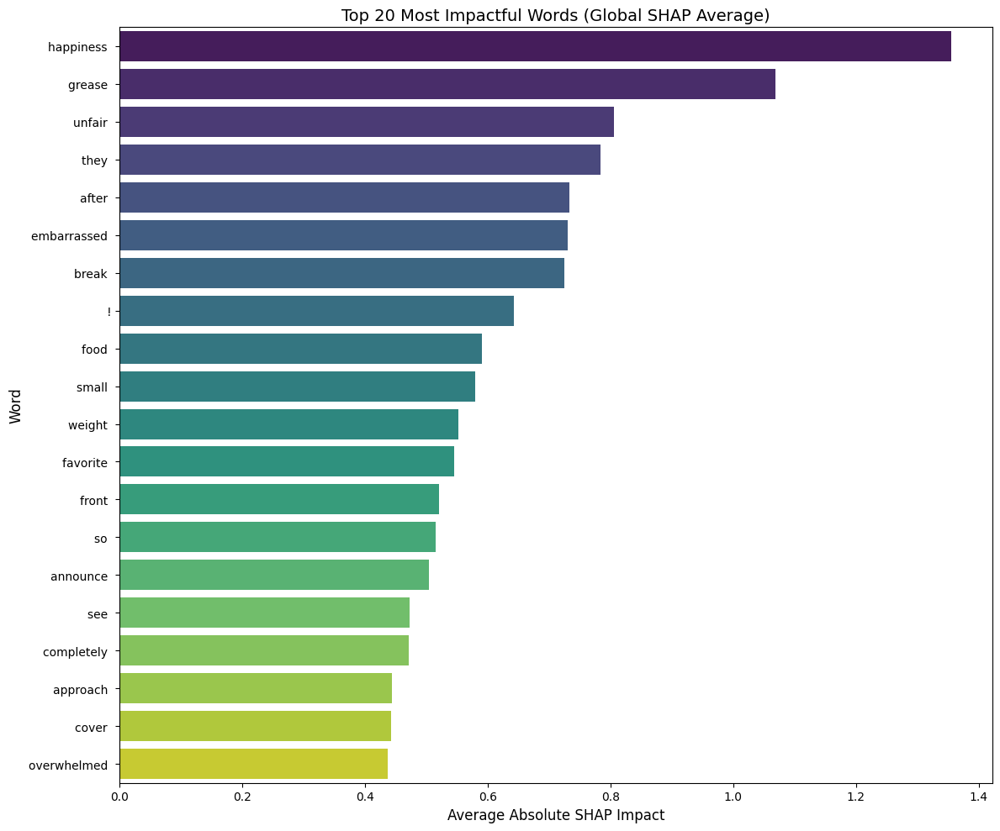

Generated bar chart for the top 20 most impactful words.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Select the top 20 most impactful words
top_20_words = word_impact_df.head(20)

# 2. Create the bar chart
plt.figure(figsize=(12, 10))
sns.barplot(x='average_impact', y='word', data=top_20_words, palette='viridis', hue='word', legend=False)

# 3. Add labels and title for clarity
plt.xlabel('Average Absolute SHAP Impact', fontsize=12)
plt.ylabel('Word', fontsize=12)
plt.title('Top 20 Most Impactful Words (Global SHAP Average)', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

print("Generated bar chart for the top 20 most impactful words.")

# **LIME**

In [ ]:
!pip install lime
from lime.lime_text import LimeTextExplainer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 25.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0d930c82aff994c77f36ad93614c89ba9212ddf72d546daf14a1e083f66f01d0
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import numpy as np

def predictor(texts):
    # Get predictions from your pipeline
    outputs = pred_pipeline(texts)

    # Transform list of dicts into a 2D numpy array of scores
    # We ensure they are ordered by the label index (0-6)
    probas = []
    for out in outputs:
        # Sort by label name/index to ensure consistency
        sorted_out = sorted(out, key=lambda x: int(x['label'].split('_')[-1]))
        probas.append([dict_item['score'] for dict_item in sorted_out])

    return np.array(probas)

In [ ]:
# Initialize explainer with your class names (Fear, Joy, etc.)
explainer = LimeTextExplainer(class_names=class_names)

# Pick a text to explain
text_to_explain = "I felt so small and embarrassed when my mistake was pointed out in front of the whole class."

# Generate explanation
# num_features: how many words to show in the bar chart
exp = explainer.explain_instance(text_to_explain, predictor, num_features=10, labels=[class_names.index('fear')])

# Show in Colab
exp.show_in_notebook(text=True)

text from my data

In [ ]:
import numpy as np
from lime.lime_text import LimeTextExplainer

# Define the predictor function for LIME
def predictor(texts):
    # Get raw outputs from pipeline (returns list of lists of dicts)
    outputs = pred_pipeline(texts)

    # Extract scores and ensure they are sorted by label index (0, 1, 2...)
    all_probas = []
    for row in outputs:
        # Sort by label string (e.g., 'LABEL_0', 'LABEL_1') to match class_names order
        sorted_probs = sorted(row, key=lambda x: int(x['label'].split('_')[-1]))
        all_probas.append([item['score'] for item in sorted_probs])

    return np.array(all_probas)

# Initialize the Explainer
explainer = LimeTextExplainer(class_names=class_names)

In [ ]:
import IPython.display as display_ip

# 1. Pick a specific row from your dataset (e.g., index 10)
index = 6
sample_text = df.iloc[index]['content'] # Change 'content' to your text column name if different
actual_emotion = df.iloc[index]['emotion']

# 2. Get the model's prediction for this specific text
pred = pred_pipeline(sample_text)[0]
# Find the label with the highest score
top_pred = max(pred, key=lambda x: x['score'])
predicted_label_idx = int(top_pred['label'].split('_')[-1])
predicted_emotion = class_names[predicted_label_idx]

print(f"Original Text: {sample_text}")
print(f"Actual Emotion: {actual_emotion} | Predicted: {predicted_emotion} ({top_pred['score']:.2f} confidence)")

# 3. Generate the Explanation for the Predicted Label
exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=10,
    labels=[predicted_label_idx] # Focus the explanation on the winning class
)

# 4. Get the HTML content and wrap it in a styled div for a white background
html_content = exp.as_html(text=True)
styled_html_output = f"""
<div style="background-color: white; padding: 20px; border-radius: 5px;">
    {html_content}
</div>
"""

display_ip.display(display_ip.HTML(styled_html_output))

Original Text: i feel guilty when when i realize that i consider material things  
more important than caring for my relatives  i feel very  
selfcentered
Actual Emotion: guilt | Predicted: guilt (1.00 confidence)


In [ ]:
import IPython.display as display_ip

# 1. Pick a specific row from your dataset (e.g., index 10)
index = 13
sample_text = df.iloc[index]['content'] # Change 'content' to your text column name if different
actual_emotion = df.iloc[index]['emotion']

# 2. Get the model's prediction for this specific text
pred = pred_pipeline(sample_text)[0]
# Find the label with the highest score
top_pred = max(pred, key=lambda x: x['score'])
predicted_label_idx = int(top_pred['label'].split('_')[-1])
predicted_emotion = class_names[predicted_label_idx]

print(f"Original Text: {sample_text}")
print(f"Actual Emotion: {actual_emotion} | Predicted: {predicted_emotion} ({top_pred['score']:.2f} confidence)")

# 3. Generate the Explanation for the Predicted Label
exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=10,
    labels=[predicted_label_idx] # Focus the explanation on the winning class
)

# 4. Get the HTML content and wrap it in a styled div for a white background
html_content = exp.as_html(text=True)
styled_html_output = f"""
<div style="background-color: white; padding: 20px; border-radius: 5px;">
    {html_content}
</div>
"""

display_ip.display(display_ip.HTML(styled_html_output))

Original Text: when i think that i do not study enough  after the weekend i  
think that i should have been able to have accomplished  
something during that time
Actual Emotion: guilt | Predicted: guilt (0.64 confidence)


In [ ]:
import IPython.display as display_ip

# 1. Pick a specific row from your dataset (e.g., index 10)
index = 3
sample_text = df.iloc[index]['content'] # Change 'content' to your text column name if different
actual_emotion = df.iloc[index]['emotion']

# 2. Get the model's prediction for this specific text
pred = pred_pipeline(sample_text)[0]
# Find the label with the highest score
top_pred = max(pred, key=lambda x: x['score'])
predicted_label_idx = int(top_pred['label'].split('_')[-1])
predicted_emotion = class_names[predicted_label_idx]

print(f"Original Text: {sample_text}")
print(f"Actual Emotion: {actual_emotion} | Predicted: {predicted_emotion} ({top_pred['score']:.2f} confidence)")

# 3. Generate the Explanation for the Predicted Label
exp = explainer.explain_instance(
    sample_text,
    predictor,
    num_features=10,
    labels=[predicted_label_idx] # Focus the explanation on the winning class
)

# 4. Get the HTML content and wrap it in a styled div for a white background
html_content = exp.as_html(text=True)
styled_html_output = f"""
<div style="background-color: white; padding: 20px; border-radius: 5px;">
    {html_content}
</div>
"""

display_ip.display(display_ip.HTML(styled_html_output))

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


Original Text: when i think about the short time that we live and relate it to  
the periods of my life when i think that i did not use this  
short time
Actual Emotion: sadness | Predicted: sadness (0.95 confidence)


In [ ]:
import IPython.display as display_ip

# 1. Pick a specific row from your dataset (e.g., index 10)
index = 4
sample_text = df.iloc[index]['content'] # Change 'content' to your text column name if different
actual_emotion = df.iloc[index]['emotion']

# 2. Get the model's prediction for this specific text
pred = pred_pipeline(sample_text)[0]
# Find the label with the highest score
top_pred = max(pred, key=lambda x: x['score'])
predicted_label_idx = int(top_pred['label'].split('_')[-1])
predicted_emotion = class_names[predicted_label_idx]

print(f"Original Text: {sample_text}")
print(f"Actual Emotion: {actual_emotion} | Predicted: {predicted_emotion} ({top_pred['score']:.2f} confidence)")

# 3. Generate the Explanation for the Predicted Label
exp = explainer.explain_instance(5
    sample_text,
    predictor,
    num_features=10,
    labels=[predicted_label_idx] # Focus the explanation on the winning class
)

# 4. Get the HTML content and wrap it in a styled div for a white background
html_content = exp.as_html(text=True)
styled_html_output = f"""
<div style="background-color: white; padding: 20px; border-radius: 5px;">
    {html_content}
</div>
"""

display_ip.display(display_ip.HTML(styled_html_output))

Original Text: at a gathering i found myself involuntarily sitting next to two  
people who expressed opinions that i considered very low and  
discriminating
Actual Emotion: disgust | Predicted: disgust (0.95 confidence)
